# What's cooking - 3

In [1]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import json as json
import numpy as np

# Import data
data = json.load(open('train.json'))

# Import scikit learn
from sklearn import svm

In [2]:
# Make category vector (the y)
category = []
for i in xrange(len(data)):
    category.append(data[i]['cuisine'])
    
category = np.array(category)

In [3]:
# Check to make sure it worked
print category[1:10]
print category[1]

[u'southern_us' u'filipino' u'indian' u'indian' u'jamaican' u'spanish'
 u'italian' u'mexican' u'italian']
southern_us


In [4]:
# First need a list of all of the unique ingredients. I will steal code from last attempt. 

# Filter out duplicates using a set
full_ingredient_set = set()

count = 0
for x in xrange (0,len(data)):
    for y in xrange (0,len(data[x]['ingredients'])):
        full_ingredient_set.add(data[x]['ingredients'][y])
        count += 1

print len(full_ingredient_set)

6714


In [5]:
# Need a list of the ingredients instead of a set so that it has indices
full_ingredient_list = list(full_ingredient_set)

In [6]:
# Create a list of all words so that we will have them separate
all_words = []
for i in xrange(len(data)):
    for j in range(len(data[i]['ingredients'])):
        new_words = data[i]['ingredients'][j].split()
        all_words.extend(new_words)
    
print len(all_words)

807760


In [7]:
# Import NLTK
from nltk.book import *

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


In [8]:
# Check the frequency distribution
fdist1 = FreqDist(all_words)

In [10]:
# This is a test
saying = ['After', 'all', 'is', 'said', 'and', 'done','more', 'is', 'said', 'than', 'done']
tokens = set(saying)
tokens = sorted(tokens)
print tokens[-2:]
print tokens

['said', 'than']
['After', 'all', 'and', 'done', 'is', 'more', 'said', 'than']


In [11]:
# Look at the stats of the frequency distribution
print fdist1

<FreqDist with 3589 samples and 807760 outcomes>


Wait, before doing the frequency distribution, I want to make them all lowercase.

In [12]:
# Make a new list with all lowercase words
all_words_lower = [word.lower() for word in all_words]

In [13]:
# Check to see if original list (all_words) is unchanged
print all_words[1500:1600]

[u'blue', u'cheese', u'garlic', u'cloves', u'chuck', u'hamburger', u'buns', u'hot', u'pepper', u'sauce', u'creole', u'seasoning', u'onions', u'mayonaise', u'ground', u'black', u'pepper', u'salt', u'okra', u'pods', u'andouille', u'sausage', u'olive', u'oil', u'watercress', u'fresh', u'lemon', u'juice', u'sugar', u'vanilla', u'eggs', u'self', u'rising', u'flour', u'confectioners', u'sugar', u'milk', u'softened', u'butter', u'food', u'colouring', u'butter', u'Madeira', u'foie', u'gras', u'demi-glace', u'sherry', u'vinegar', u'whipping', u'cream', u'white', u'bread', u'Fuyu', u'persimmons', u'salt', u'egg', u'bread', u'watercress', u'fenugreek', u'leaves', u'olive', u'oil', u'garlic', u'black', u'mustard', u'seeds', u'ground', u'cumin', u'amchur', u'lime', u'wedges', u'scallions', u'coriander', u'sugar', u'fingerling', u'potatoes', u'green', u'chilies', u'chopped', u'cilantro', u'tumeric', u'fresh', u'ginger', u'root', u'salt', u'ramps', u'black', u'peppercorns', u'cinnamon', u'sticks', u'

See above, a couple of words with uppercase starting letters. So cool, we still have our original list unchanged.

## Frequency Distribution

In [14]:
# Check the frequency distribution
fdist1 = FreqDist(all_words_lower)

In [15]:
print fdist1

<FreqDist with 3187 samples and 807760 outcomes>


In [16]:
print fdist1.most_common(30)

[(u'pepper', 25686), (u'salt', 24426), (u'oil', 23323), (u'garlic', 18921), (u'ground', 18256), (u'fresh', 17853), (u'sauce', 13129), (u'sugar', 12493), (u'onions', 12341), (u'cheese', 11633), (u'chicken', 11448), (u'olive', 10920), (u'black', 10557), (u'water', 9790), (u'red', 9189), (u'flour', 8848), (u'butter', 8600), (u'tomatoes', 8597), (u'green', 8531), (u'powder', 8286), (u'chopped', 7884), (u'cloves', 7557), (u'juice', 7146), (u'white', 6913), (u'onion', 6901), (u'eggs', 6502), (u'cream', 6096), (u'rice', 6073), (u'cilantro', 5950), (u'milk', 5823)]


There seems to be a dropoff in frequency between the words 'fresh' and 'sauce', as before, leaving me to think we should have 6 stop words that we remove for now

Let's explore the other methods associated with frequency distributions in NLTK

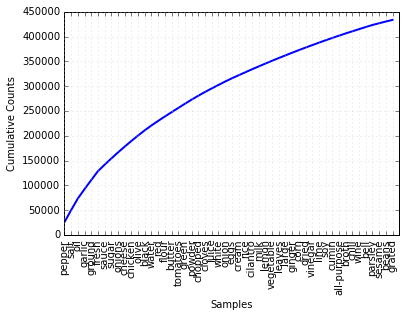

In [17]:
# Plot the frequency distribution, cumulative
fdist1.plot(50, cumulative=True)

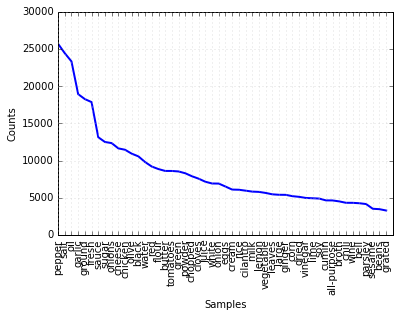

In [18]:
# Plot the frequency distribution, cumulative
fdist1.plot(50)


This plot confirms our suspicion 

In [19]:
print fdist1.most_common(15)[0]

# Make a list of stop words
stop_words = [w[0] for w in fdist1.most_common(15) if w[1] > 15000]
print stop_words

(u'pepper', 25686)
[u'pepper', u'salt', u'oil', u'garlic', u'ground', u'fresh']


Make a set (no duplicates) then remove stop words below:

In [20]:
reduced_word_list_1 = list(set(all_words_lower))
print len(reduced_word_list_1)

for word in stop_words:
    reduced_word_list_1.remove(word)
print len(reduced_word_list_1)

3187
3181


# Take a look at least common words

In [21]:
n_words = fdist1.N()
print n_words
print fdist1

807760
<FreqDist with 3187 samples and 807760 outcomes>


In [22]:
print fdist1.max()

pepper


In [23]:
one_count_words = []

for sample in fdist1:
    if fdist1.freq(sample) < 2:
        one_count_words.append(sample)

print len(one_count_words)
print one_count_words

3187
[u'ogura-an', u'broiler-fryer', u'ginkgo', u'unflavored', u'mackerel', u'yellow', u'sichuan', u'negi', u'clotted', u'asian', u'cummin', u'pheasant', u'chowchow', u'canes', u'hyssop', u"breakstone's", u'cannoli', u'pillsbury\u2122', u'segments', u'gold\xae', u'pancetta', u'manis', u'deli', u'rise', u'rib-eye', u'gremolata', u'jack', u'softened', u'four', u'caramels', u'baking', u'broiler', u'wholemeal', u'fruitcake', u'chambord', u'solid', u'woods', u'moulard', u'cholesterol', u'poppy', u'uncooked', u'muscovy', u'ranch-style', u'orzo', u'jamaica', u'speck', u'mazola\xae', u'ravva', u'almond', u'bacon', u'japanese', u'millet', u'brill', u'soppressata', u'chee', u'bucatini', u'cactus', u'blue', u'sesame', u'porcini', u'tipo', u'96%', u'cooking', u'fingers', u'salsify', u'no-stick', u'galangal', u'new', u'zesty', u'croutons', u'topside', u'hero', u'devein', u'kefalotyri', u'romano', u'jasmine', u'ramps', u'broccolini', u'marnier', u'pate', u'jamon', u'textured', u'active', u'100', u'j

That clearly didn't work, it just printed every word :/ 

In [24]:
print fdist1.freq('butter')

0.0106467267505


Oh, they're all less than one...

In [25]:
print fdist1.freq('salt')

0.0302391799544


In [26]:
# See if they all add up to one
total = 0

for sample in fdist1:
    total += fdist1.freq(sample)

print total

1.0


Let's try this again

In [27]:
one_count_words = []

for sample in fdist1:
    if fdist1.freq(sample) * n_words < 2:
        one_count_words.append(sample)

print len(one_count_words)
print one_count_words

594
[u'ogura-an', u'chowchow', u'hyssop', u"breakstone's", u'fruitcake', u'woods', u'moulard', u'muscovy', u'ranch-style', u'speck', u'mazola\xae', u'brill', u'chee', u'tipo', u'96%', u'no-stick', u'topside', u'jamon', u'100', u'qua', u'mezzetta', u'chopmeat', u'seven', u'estancia', u'ploy', u'blueberri', u'foster', u'ti', u'alexia', u'mahlab', u'psyllium', u'creations\xae', u'india', u'crouton', u'fondant', u'kippers', u'lap', u'kampyo', u'maraschino', u'chartreuse', u'originals\xae', u',', u'better', u'budweiser', u'bream', u'pareve', u'velvet', u'meat-filled', u'stolichnaya', u'nama', u'bris\xe9e', u'boquerones', u'xuxu', u'ornamental', u'lambrusco', u'tyson', u'wieners', u'panch', u'ribeye', u'nakano', u'cumberland', u'lambic', u'low-moisture', u'victoria', u'passover', u'shiromiso', u'phoran', u'chong', u'tropic', u'do', u'pocket', u'holland', u'azteca', u'linguisa', u'bag', u'pro.activ', u'crocker\u2122', u'yoplait', u'00', u'artificial', u'mentaiko', u'eggnog', u'calabrese', u'u

Looks like some of these are plurals, some are misspellings, and some have special characters that didn't show up well

# Lemmatization

In [28]:
from __future__ import division  # Python 2 users only
import nltk, re, pprint
from nltk import word_tokenize

In [29]:
wnl = nltk.WordNetLemmatizer()
all_words_lower_lem = [wnl.lemmatize(t) for t in all_words_lower]

In [30]:
# Check the new frequency distribution
fdist2 = FreqDist(all_words_lower_lem)
print fdist2

<FreqDist with 2965 samples and 807760 outcomes>


3187 to 2965, not bad. 

In [31]:
one_count_words_new = []

for sample in fdist2:
    if fdist2.freq(sample) * n_words < 2:
        one_count_words_new.append(sample)

print len(one_count_words_new)

558


Created more words that appear only once! 

Here's what I'll do - I'll lematize words and if that word is already found somewhere in the corpus, I'll leave it, otherwise I'll throw it out. 

In [32]:
all_words_lower_lem = [wnl.lemmatize(t) for t in all_words_lower]
most_words_lem = list(all_words_lower)


In [33]:

for t in all_words_lower_lem:
    if t not in most_words_lem:
        most_words_lem.remove(all_words_lower[all_words_lower_lem.index(t)])

In [34]:
print len(most_words_lem)
most_words_list = list(set(most_words_lem))
print len(most_words_list)

801784
3069


In [35]:
fdist3 = FreqDist(most_words_lem)

In [36]:
print fdist3

<FreqDist with 3069 samples and 801784 outcomes>


In [37]:
one_count_words_2 = []

for sample in fdist3:
    if fdist3.freq(sample) * 801775 < 2:
        one_count_words_2.append(sample)

print len(one_count_words_2)

878


In [38]:
for word in one_count_words_2: 
    most_words_list.remove(word)

In [39]:
for word in stop_words:
    most_words_list.remove(word)

In [40]:
print len(most_words_list)

2185


In [41]:
two_count_words_2 = []

for sample in fdist3:
    if fdist3.freq(sample) * 801775 < 3:
        two_count_words_2.append(sample)

print len(two_count_words_2)

1064


In [42]:
reduced_word_list = list(most_words_list)
for word in two_count_words_2:
    if word in reduced_word_list:
        reduced_word_list.remove(word)
print len(reduced_word_list)

1999


# Random forest

In [43]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 100)

In [44]:
n_recipes = len(category)

# Make a feature matrix
word_features = np.zeros(shape = (n_recipes, len(reduced_word_list)))

for i in xrange(n_recipes):
    for ingredient in data[i]['ingredients']:
        for word in reduced_word_list:
            if word in ingredient.lower():
                word_index = reduced_word_list.index(word)
                word_features[i, word_index] += 1

In [45]:
import copy
data_processed = copy.deepcopy(data)

In [46]:
# Lemmatize features in the data structure
for i in xrange(n_recipes):
    lemmas = list()
    for ingredient in data[i]['ingredients']:
        if " " in ingredient:
            ingredients = ingredient.split()
            try:
                lemmas = lemmas.extend([wnl.lemmatize(t) for t in ingredients])
            except: 
                lemmas = [wnl.lemmatize(t) for t in ingredients]
        else:
            try:
                lemmas = lemmas.extend(wnl.lemmatize(ingredient))
            except:
                lemmas = wnl.lemmatize(ingredient)
    data_processed[i]['ingredients'] = lemmas

In [47]:
n_recipes = len(category)

# Make a feature matrix
new_word_features = np.zeros(shape = (n_recipes, len(reduced_word_list)))

for i in xrange(n_recipes):
    for ingredient in data_processed[i]['ingredients']:
        for word in reduced_word_list:
            if word in ingredient.lower():
                word_index = reduced_word_list.index(word)
                new_word_features[i, word_index] += 1

TypeError: 'NoneType' object is not iterable

Having issues, will split pre-processing of "data" into multiple steps

In [48]:
# Maybe I'll try a shallow copy
data_processed = copy.copy(data)
print type(data_processed)
print data_processed[1]

<type 'list'>
{u'cuisine': u'southern_us', u'id': 25693, u'ingredients': [u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'ground black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']}


In [49]:
# Split ingredients that have multiple words
for i in xrange(n_recipes):
    for ingredient in data_processed[i]['ingredients']:
        if ' ' in ingredient:
            data_processed[i]['ingredients'].remove(ingredient)
            data_processed[i]['ingredients'].extend(ingredient.split())


In [50]:
# Lemmatize features in the data structure
for i in xrange(n_recipes):
    data[i]['ingredients'] = [wnl.lemmatize(t.lower()) for t in data[i]['ingredients']]
        

In [51]:
n_recipes = len(category)

# Make a feature matrix
new_word_features = np.zeros(shape = (n_recipes, len(reduced_word_list)))

for i in xrange(n_recipes):
    for ingredient in data_processed[i]['ingredients']:
        for word in reduced_word_list:
            if word in ingredient:
                word_index = reduced_word_list.index(word)
                new_word_features[i, word_index] += 1

# Split

In [52]:
from sklearn.cross_validation import train_test_split
feats_train, feats_test, cats_train, cats_test = \
                train_test_split(new_word_features, category, test_size = 0.20)

# Try Random Forests, just to see

In [80]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 100)

In [154]:
classifier.fit(feats_train, cats_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [155]:
classifier.score(feats_test, cats_test)

0.73903205531112504

Not great

# Naive Bayes

In [162]:
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(feats_train, cats_train)

GaussianNB()

In [163]:
clf.score(feats_test, cats_test)

0.24349465744814583

### Multinominal Naive Bayes


In [164]:
from sklearn.naive_bayes import MultinomialNB
clf_multi = MultinomialNB()

In [165]:
clf_multi.fit(feats_train, cats_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [166]:
clf_multi.score(feats_test, cats_test)

0.68988057825267124

### Bernoulli Naive Bayes

In [168]:
from sklearn.naive_bayes import BernoulliNB
clf_bernoulli = BernoulliNB()

In [169]:
clf_bernoulli.fit(feats_train, cats_train)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [170]:
clf_bernoulli.score(feats_test, cats_test)

0.68447517284726589

# Test data


In [53]:
# Load in test data
test_data = json.load(open('test.json'))

In [54]:
print test_data

[{u'id': 18009, u'ingredients': [u'baking powder', u'eggs', u'all-purpose flour', u'raisins', u'milk', u'white sugar']}, {u'id': 28583, u'ingredients': [u'sugar', u'egg yolks', u'corn starch', u'cream of tartar', u'bananas', u'vanilla wafers', u'milk', u'vanilla extract', u'toasted pecans', u'egg whites', u'light rum']}, {u'id': 41580, u'ingredients': [u'sausage links', u'fennel bulb', u'fronds', u'olive oil', u'cuban peppers', u'onions']}, {u'id': 29752, u'ingredients': [u'meat cuts', u'file powder', u'smoked sausage', u'okra', u'shrimp', u'andouille sausage', u'water', u'paprika', u'hot sauce', u'garlic cloves', u'browning', u'lump crab meat', u'vegetable oil', u'all-purpose flour', u'freshly ground pepper', u'flat leaf parsley', u'boneless chicken skinless thigh', u'dried thyme', u'white rice', u'yellow onion', u'ham']}, {u'id': 35687, u'ingredients': [u'ground black pepper', u'salt', u'sausage casings', u'leeks', u'parmigiano reggiano cheese', u'cornmeal', u'water', u'extra-virgin 

In [55]:
# Do all of the same processing to test data that I did to the rest

In [58]:
# Make a copy
test_data_processed = copy.copy(test_data)
print type(test_data_processed)
print test_data_processed[1]

<type 'list'>
{u'id': 28583, u'ingredients': [u'sugar', u'corn starch', u'bananas', u'milk', u'toasted pecans', u'light rum', u'egg', u'yolks', u'cream', u'of', u'tartar', u'vanilla', u'wafers', u'vanilla', u'extract', u'egg', u'whites']}


In [59]:
# Split ingredients that have multiple words
for i in xrange(len(test_data)):
    for ingredient in test_data_processed[i]['ingredients']:
        if ' ' in ingredient:
            test_data_processed[i]['ingredients'].remove(ingredient)
            test_data_processed[i]['ingredients'].extend(ingredient.split())

In [60]:
# Lemmatize features in the data structure
for i in xrange(len(test_data)):
    test_data[i]['ingredients'] = [wnl.lemmatize(t.lower()) for t in test_data[i]['ingredients']]

In [61]:
# Make a feature matrix
test_data_features = np.zeros(shape = (len(test_data), len(reduced_word_list)))

for i in xrange(len(test_data)):
    for ingredient in test_data_processed[i]['ingredients']:
        for word in reduced_word_list:
            if word in ingredient:
                word_index = reduced_word_list.index(word)
                test_data_features[i, word_index] += 1

In [239]:
cats = clf_multi.predict(test_data_features)

In [240]:
ids = [str(test_data[x]['id']) for x in range(len(test_data))]

In [241]:
import csv as csv


# Print out my submission
submission_2_file = open('erh_submission_2_WC.csv', 'wb')
submission_object = csv.writer(submission_2_file)
submission_object.writerow(['id', 'cuisine'])


for x in xrange(len(cats)):
    submission_object.writerow([str(ids[x]), str(cats[x])])

submission_2_file.close()


# 0.68192, place 1146. 




Next week: 

# TF/IDF

In [63]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

clf = MultinomialNB()
count_vectorizer = CountVectorizer()
x_train = count_vectorizer.fit_transform(feats_train)
clf.fit(x_train, cats_train)
score = clf.score(count_vectorizer.transform(feats_test), cats_test)

AttributeError: 'numpy.ndarray' object has no attribute 'lower'

In [64]:
from pandas import DataFrame


In [67]:
clf = MultinomialNB()
count_vectorizer = CountVectorizer()
#feats_train_df = DataFrame(feats_train)
x_train = count_vectorizer.fit_transform(data_processed['ingredients'])
clf.fit(x_train, category)
#score = clf.score(count_vectorizer.transform(feats_test), cats_test)

TypeError: list indices must be integers, not str

In [70]:
ten_count_words = []

for sample in fdist3:
    if fdist3.freq(sample) * 801775 < 10:
        ten_count_words.append(sample)

print len(ten_count_words)

1624


In [75]:
fewer_words_list = list(most_words_list)
for word in ten_count_words: 
    try:
        fewer_words_list.remove(word)
    except:
        print "hello"

hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hell

In [76]:
print len(fewer_words_list)

1439


In [84]:
n_recipes = len(category)

# Make a feature matrix
few_word_features = np.zeros(shape = (n_recipes, len(fewer_words_list)))

for i in xrange(n_recipes):
    for ingredient in data[i]['ingredients']:
        for word in fewer_words_list:
            if word in ingredient.lower():
                word_index = fewer_words_list.index(word)
                few_word_features[i, word_index] += 1

In [85]:
from sklearn.cross_validation import train_test_split
feats_train_3, feats_test_3, cats_train_3, cats_test_3 = \
                train_test_split(few_word_features, category, test_size = 0.20)

In [86]:
classifier.fit(feats_train_3, cats_train_3)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [87]:
classifier.score(feats_test_3, cats_test_3)

0.74883720930232556

In [88]:
from sklearn.decomposition import PCA
pca = PCA(.8)

In [104]:
feats_train_proj = pca.fit_transform(feats_train)

In [105]:
feats_test_proj = pca.transform(feats_test)

In [106]:
classifier.fit(feats_train_proj, cats_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [107]:
classifier.score(feats_test_proj, cats_test)

0.59912005028284099

In [9]:
print full_ingredient_list


[u'low-sodium fat-free chicken broth', u'sweetened coconut', u'baking chocolate', u'egg roll wrappers', u'bottled low sodium salsa', u'vegan parmesan cheese', u'clam sauce', u'mahlab', u'(10 oz.) frozen chopped spinach, thawed and squeezed dry', u'figs', u'caramels', u'broiler', u'jalapeno chilies', u'(15 oz.) refried beans', u'brioche buns', u'broccoli romanesco', u'flaked oats', u'anise extract', u'whole wheat pastry flour', u'ravva', u'bacon', u'millet', u'country crock honey spread', u'matcha green tea powder', u'chopped fresh thyme', u'chicken gravy mix', u'walnut oil', u'Kraft Slim Cut Mozzarella Cheese Slices', u'fresh angel hair', u'salsify', u'galangal', u'chicken schmaltz', u'butter crackers', u'jasmine', u'Bisquick Baking Mix', u'canned jalapeno peppers', u'short-grain rice', u'ground cayenne pepper', u'orange soda', u'ginseng tea', u'calamansi juice', u'butter oil', u'steel-cut oats', u'chinese buns', u'boneless ham', u'chipotle sauce', u'honey dijon mustard', u'custard des

In [10]:
print all_words


[u'romaine', u'lettuce', u'black', u'olives', u'grape', u'tomatoes', u'garlic', u'pepper', u'purple', u'onion', u'seasoning', u'garbanzo', u'beans', u'feta', u'cheese', u'crumbles', u'plain', u'flour', u'ground', u'pepper', u'salt', u'tomatoes', u'ground', u'black', u'pepper', u'thyme', u'eggs', u'green', u'tomatoes', u'yellow', u'corn', u'meal', u'milk', u'vegetable', u'oil', u'eggs', u'pepper', u'salt', u'mayonaise', u'cooking', u'oil', u'green', u'chilies', u'grilled', u'chicken', u'breasts', u'garlic', u'powder', u'yellow', u'onion', u'soy', u'sauce', u'butter', u'chicken', u'livers', u'water', u'vegetable', u'oil', u'wheat', u'salt', u'black', u'pepper', u'shallots', u'cornflour', u'cayenne', u'pepper', u'onions', u'garlic', u'paste', u'milk', u'butter', u'salt', u'lemon', u'juice', u'water', u'chili', u'powder', u'passata', u'oil', u'ground', u'cumin', u'boneless', u'chicken', u'skinless', u'thigh', u'garam', u'masala', u'double', u'cream', u'natural', u'yogurt', u'bay', u'leaf',

In [12]:
spices_list = ['garam_masala', 'salt', 'turmeric', 'red_pepper_flakes',
               'parsley', 'cinnamon','chili_powder', 'cardamom', 'black_pepper',
               'paprika', 'allspice', 'vanilla_extract', 'ginger', 'thyme',
               'cilantro', 'anise_seeds', 'brown_sugar', 'oregano', 'cayenne_pepper',
               'arrowroot_powder', 'rosemary', 'tarragon',  
               'coriander', 'cumin']
other_additions_list = ['peanut', 'lemon_juice', 'sesame_seeds', 'garlic', 'lime_juice']

In [55]:
import re
messy_words = [re.search('[^A-Za-z -]',z) != None for z in full_ingredient_list]
print messy_words[1:20]

[False, False, False, False, False, False, False, True, False, False, False, False, True, False, False, False, False, False, False]


In [56]:
messy_words_list = [full_ingredient_list[a]  for a in range(len(full_ingredient_list)) if messy_words[a]]

In [57]:
print len(full_ingredient_list)
print len(messy_words_list)

6714
233


In [58]:
print messy_words_list

[u'(10 oz.) frozen chopped spinach, thawed and squeezed dry', u'(15 oz.) refried beans', u'Bertolli Tomato & Basil Sauce', u'Country Crock\xae Spread', u"Cox's Orange Pippin", u'Pillsbury\u2122 Crescent Recipe Creations\xae refrigerated seamless dough sheet', u'Land O Lakes\xae Butter', u'sweet italian sausag links, cut into', u'Bertolli\xae Alfredo Sauce', u'Neufch\xe2tel', u'b\xe2tarde', u'Honeysuckle White\xae Hot Italian Turkey Sausage Links', u'Hidden Valley\xae Original Ranch Salad\xae Dressing & Seasoning Mix', u'quatre \xe9pices', u'flour tortillas (not low fat)', u'Crystal Farms\xae Shredded Cheddar Cheese', u'Ni\xe7oise olives', u'33% less sodium ham', u'water chestnuts, drained and chopped', u'Wish-Bone\xae Robusto Italian Dressing', u'2 1/2 to 3 lb. chicken, cut into serving pieces', u'(   oz.) tomato paste', u'Sargento\xae Traditional Cut Shredded 4 Cheese Mexican', u'2% low fat cheddar chees', u'Yoplait\xae Greek 100 blackberry pie yogurt', u'tortellini, cook and drain', 

In [65]:
ingredients_dict = {}
for 

TypeError: coercing to Unicode: need string or buffer, list found

In [ ]:
print ta